In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from anndata import AnnData
import scanpy as sc

In [2]:
data = sc.read("data/st_lymph.h5ad")

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
est_props = pd.read_table("data/DISSECT.txt", index_col=0)
est_scores = pd.read_table("data/DISSECT_scores.txt", index_col=0)

est_scores[est_scores<0] = 0 # Remove negative scores
est_scores = est_scores.div(est_scores.sum(1), 0) # Normalize to sum to 1
est_scores = est_scores.fillna(0)

data_props = data.copy()
data_scores = data.copy()

data_props.obs = pd.concat([data_props.obs, est_props], axis=1)
data_scores.obs = pd.concat([data_scores.obs, est_scores], axis=1)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
sc.set_figure_params(dpi=250)

# Show GC cell types, Treg and FDC in main


In [5]:
bgc_cts = [col for col in data_scores.obs.columns if "GC" in col or "B_Cycling" in col or "Treg" in col \
          or "FDC" in col]

In [6]:
sns.set(font_scale=0.7)

In [7]:
cmap = "magma"

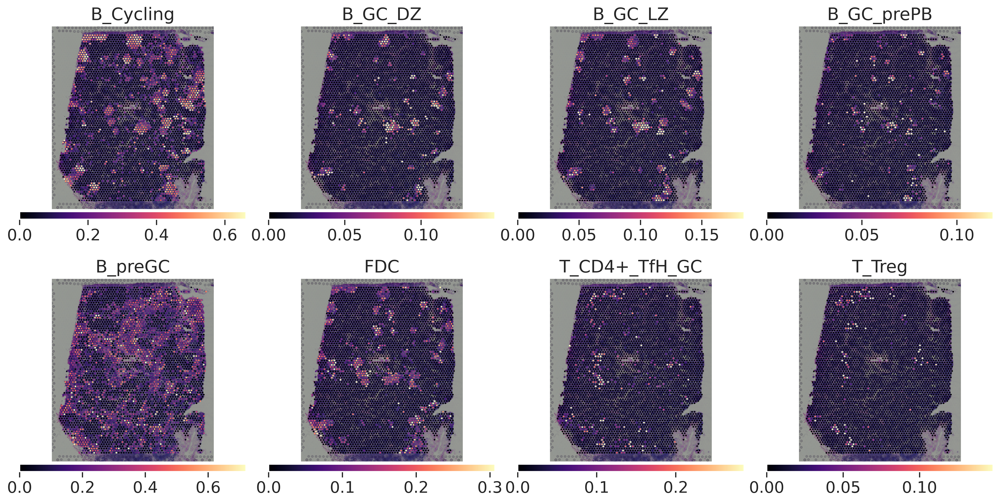

In [8]:
sns.set(font_scale=1.5)

g = sc.pl.spatial(data_scores, color=bgc_cts, cmap=cmap,
                 colorbar_loc="bottom", wspace=0.1, return_fig=True, show=False, 
                  vmax=["p99" for ct in bgc_cts],)

for ax in g:
    ax.set_xlabel("")
    ax.set_ylabel("")
    
plt.savefig("plots/dissect_lymph_node_scores_{}.png".format(cmap), bbox_inches="tight")

# Show all cell type

In [9]:
cols = est_scores.columns

In [10]:
sns.set(font_scale=1.5)
g = sc.pl.spatial(data_scores, color=cols, cmap=cmap,
                 colorbar_loc="bottom", wspace=0.1, return_fig=True, show=False, 
                  vmin=0, vmax=["p99" for ct in cols],
                 ncols=4)
for ax in g:
    ax.set_xlabel("")
    ax.set_ylabel("")
plt.savefig("plots/dissect_lymph_node_all_scores_{}.png".format(cmap), bbox_inches="tight")
plt.close()